<span style='color:Blue'> <span style="font-size:25px;"> **[WELL : 9-lTP-1-RJS] Loading-Sorting-Preprocessing-create log plot-export CSV file of a DLIS file**

In [1]:
%%capture

%pip install dlisio                                                   
%pip install qbstyles                                                 
%pip install folium 
%pip install geopandas

from dlisio import dlis
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import matplotlib.patches as mpatches                                 

import folium                                                         
from folium import plugins 
import json                                                           

from qbstyles import mpl_style
mpl_style(dark=False)                                                 

from matplotlib_inline.backend_inline import set_matplotlib_formats   
set_matplotlib_formats('svg')                                         

<span style='color:black'> <span style="font-size:19px;"> **Mapping WELLs:**

**1-BRSA-1115-RJS**
    
**3-BRSA-944A-RJS**
    
**3-BRSA-1215-RJS**
    
**9-lTP-1-RJS**

In [2]:
# Reference: https://portal.grdc.bafg.de/applications/public.html?publicuser=PublicUser#dataDownload/Subregions

# This GeoJSON file contains the coordinates of the Brazilian Sub-Regions 
# The Sub-Region of our interest is "SAO FRANCISCO BASIN"
geoJson_data1 = 'subregions.geojson'

In [3]:
# Create a map 
m = folium.Map(location=[-17,-47],        
               tiles="Stamen Terrain",     
               zoom_start=5) 

# Add a marker at the location of the wells 

folium.Marker(
    location=[ -24.578723 ,-42.541342],
    popup="1-BRSA-944A-RJS", # Second Well
    icon=folium.Icon(icon="location", prefix="fa-solid", color="orange")).add_to(m)

folium.Marker(
    location=[-24.225978,-42.443957],
    popup="1-BRSA-1115-RJS", # Second Well
    icon=folium.Icon(icon="location", prefix="fa-solid", color="blue")).add_to(m)

folium.Marker(
    location=[-24.755396,-42.694766],
    popup="1-BRSA-1215-RJS", # Second Well
    icon=folium.Icon(icon="location", prefix="fa-solid", color="black")).add_to(m)

folium.Marker(
    location=[-24.740670,-42.704778],
    popup="9-lTP-1-RJS", # Second Well
    icon=folium.Icon(icon="location", prefix="fa-solid", color="green")).add_to(m)


# Add the coordinates of the Brazilian Sub-Regions with GeoJson function 
# Desired style 
style1 = {'fillColor': 'white', 'color': 'red'} 
# GeoJson Function 
g1 = folium.GeoJson(geoJson_data1, style_function = lambda x: style1).add_to(m) 


# Add a mini map to folium adding plugins.MiniMap() to the map.
plugins.MiniMap().add_to(m)

m

<span style='color:black'> <span style="font-size:30px;"> **WELL : 9-lTP-1-RJS**

<span style='color:brown'> <span style="font-size:19px;"> **STEP 2: load all the required DLIS files**

In [4]:
dlis0, *tail0 = dlis.load('/Users/amirhosseinakhondzadeh/@ DATA/9-lTP-1-RJS/Perfil Convencional/9-itp-1-rjs_12_csng.dlis')
dlis1, *tail1 = dlis.load('/Users/amirhosseinakhondzadeh/@ DATA/9-lTP-1-RJS/Perfil Convencional/9-itp-1-rjs_12_gem.dlis')
dlis2, *tail2 = dlis.load('/Users/amirhosseinakhondzadeh/@ DATA/9-lTP-1-RJS/Perfil Convencional/9-itp-1-rjs_12_mril.dlis')      # NMR
dlis3, *tail3 = dlis.load('/Users/amirhosseinakhondzadeh/@ DATA/9-lTP-1-RJS/Perfil Convencional/9-itp-1-rjs_12_quadstack.dlis')
dlis4, *tail4 = dlis.load('/Users/amirhosseinakhondzadeh/@ DATA/9-lTP-1-RJS/Perfil Convencional/9-itp-1-rjs_16_ict.dlis')       # Cement job
dlis5, *tail5 = dlis.load('/Users/amirhosseinakhondzadeh/@ DATA/9-lTP-1-RJS/Perfil Convencional/9-itp-1-rjs_16_sdl-wstt.dlis')  # density and neutron porosity

#dlis6, *tail6 = dlis.load('/Users/amirhosseinakhondzadeh/@ DATA/9-lTP-1-RJS/Perfil Convencional/9-itp-1-rjs_12_cast.dlis')
#dlis7, *tail7 = dlis.load('/Users/amirhosseinakhondzadeh/@ DATA/9-lTP-1-RJS/Perfil Convencional/9-itp-1-rjs_12_omri.dlis')

In [5]:
# Define a list of dlis object names (assuming dlis0, dlis1, ..., dlis9 exist)
dlis_names = [f'dlis{i}' for i in range(6)]

# Define depth_units
depth_units = "in"  # Replace "units" with the actual units you want to use

for dlis_name in dlis_names:
    dlis = globals()[dlis_name]  # Get the dlis object using its name
    print("=" * 80)
    print(f"DLIS Object: {dlis_name}")
    print("=" * 80)

    for frame in dlis.frames:
        print(f"Frame Name:         {frame.name}")
        print(f"Number of Channels: {len(frame.channels)}")
        print(f"Depth Interval:     {frame.index_min} - {frame.index_max} {depth_units}")
        print(f"Depth Spacing:      {frame.spacing} {depth_units}")
        print(f"Channel Names:      {', '.join(channel.name for channel in frame.channels)}")
        print("-" * 80)

    print("%" * 80)

DLIS Object: dlis0
Frame Name:         50
Number of Channels: 13
Depth Interval:     None - None in
Depth Spacing:      -0.10000000149011612 in
Channel Names:      TDEP, GRTO, GRKT, URAN, THOR, POTA, TURT, UKRT, TKRT, GRCO, GRTO_UNC, GRTH, GKUT
--------------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
DLIS Object: dlis1
Frame Name:         50
Number of Channels: 24
Depth Interval:     None - None in
Depth Spacing:      -0.10000000149011612 in
Channel Names:      TDEP, CHIS, GOCF, GCFF, OCFF, GRDF, CS, GGCF, FTMP, GRTO, GRKT, CALI, DGD, BS, TENS, DMG, DAL, DSI, DSUL, DK, DCA, DTI, DMN, DFE
--------------------------------------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
DLIS Object: dlis2
Frame Name:         50
Number of Channels: 23
Depth Interval:     None - None in
Depth Spacing:      -0.100000001490116

<span style='color:green'> <span style="font-size:19px;"> **STEP 2: create Pandas DataFrames containing all the required Well Log Data**

* DEPTH .m = Measured Depth 


* Lithological Log
 * GR .gAPI = Gamma-Ray **(dlis 2, 3, 4, 5: GR)**


* Resistivity Log
 * RT90, RT60, RT30, RT20, RT10 .ohm.m = Resistivity Log at 10, 20, 30, 60,90 degrees **(dlis 3: RT90, RT60, RT30, RT20, RT10)**
 

* Porosity Logs
 * RHOB .g/cm3 = HRDD Standard Resolution Formation Density  **(dlis 3, 5: RHOB)**
 * NPHI .m3/m3 = Thermal Neutron Porosity (Ratio Method)     **(dlis 3 : NPHI)**


* Sonic Log
 * DTC    .us/ft   = Compressional Wave Sonic Travel Time **(dlis 3, 5: DTC)**
 





* T1DIST - T1 (Spin-Lattice) Relaxation Time Distribution
* T2DIST - T2 (Spin-Spin) Relaxation Time Distribution


* T1LM - T1 (Spin-Lattice) Logarithmic Mean
* T2LM - T2 (Spin-Spin) Logarithmic Mean


* MPHIT1
* MPHIT2
 
 
 <div style="text-align: right;">
 
| Lithological Log | Resistivity Log | Porosity Logs |
|:---------------- |:---------------:|--------------:|
| RHGX_HILT        | AT10 .ohm.m     | NPHI    |
| NPHI             | AT20 .ohm.m     |          |
| GR             | AT30 .ohm.m     |          |
    |              | AT30 .ohm.m     |          |
    |              | AT30 .ohm.m     |          |

In [6]:
# Create variable "f" which stands for frame
f0 = dlis0.object('FRAME','50')
f1 = dlis1.object('FRAME','50')
f2 = dlis2.object('FRAME','50')
f3 = dlis3.object('FRAME','50')
f4 = dlis4.object('FRAME','50')
f5 = dlis5.object('FRAME','50')

In [7]:
# Create variables "c" which stands for channel
c0 = f0.curves()
c1 = f1.curves()
c2 = f2.curves()
c3 = f3.curves()
c4 = f4.curves()
c5 = f5.curves()

In [8]:
# Define the channels/logging curves of interest for each frame "f"
# Convert DEPTH values to metres, by multiplying by 0.00254. 
# *0.00254

d2  = {'DEPTH'     : c2['TDEP'],
       'GR'        : c2['GR'],
       'MPHIT1'    : c2['MPHIT1'],
       'MPHIT2'    : c2['MPHIT2']}

"""d2  = {'DEPTH'   : c2['TDEP'],
       'GR'      : c2['GR'],
       'MPHIT1'  : c2['MPHIT1'],
       'MPHIT2'  : c2['MPHIT2'],
       'T1DIST'  : c2['T1DIST'],
       'T2DIST'  : c2['T2DIST']}"""

#MPHIT1, MPHIT2
#T1DIST, T2DIST

d3  = {'DEPTH'   : c3['TDEP'],
       'GR'      : c3['GR'],
       'RT10'    : c3['RT10'],
       'RT20'    : c3['RT20'],
       'RT30'    : c3['RT30'],
       'RT60'    : c3['RT60'],
       'RT90'    : c3['RT90'],
       'RHOB'    : c3['RHOB'],
       'NPHI'    : c3['NPHI'],
       'DTC'     : c3['DTC']}

d4  = {'DEPTH'   : c4['TDEP'],
       'GR'      : c4['GR']}

d5  = {'DEPTH'   : c5['TDEP'],
       'GR'      : c5['GR'],
      'RHOB'     : c5['RHOB'],
      'DTC'      : c5['DTC']}

In [9]:
# Create dataframes containing the required well logging curves 
#df0 = pd.DataFrame(d0)  # Depth spacing is 0.152344 m
#df1 = pd.DataFrame(d1)  # Depth spacing is 0.025391 m
df2 = pd.DataFrame(d2)  # Depth spacing is 0.076172 m
df3 = pd.DataFrame(d3)
df4 = pd.DataFrame(d4)
df5 = pd.DataFrame(d5)

In [10]:
# Print the dataframes 
df2, df3, df4, df5

(            DEPTH      GR  MPHIT1  MPHIT2
 0     5841.899902 -999.25 -999.25 -999.25
 1     5841.799902 -999.25 -999.25 -999.25
 2     5841.699902 -999.25 -999.25 -999.25
 3     5841.599902 -999.25 -999.25 -999.25
 4     5841.499902 -999.25 -999.25 -999.25
 ...           ...     ...     ...     ...
 8072  5034.699890 -999.25 -999.25 -999.25
 8073  5034.599890 -999.25 -999.25 -999.25
 8074  5034.499890 -999.25 -999.25 -999.25
 8075  5034.399890 -999.25 -999.25 -999.25
 8076  5034.299890 -999.25 -999.25 -999.25
 
 [8077 rows x 4 columns],
             DEPTH      GR    RT10    RT20    RT30    RT60    RT90    RHOB  \
 0     5842.500000 -999.25 -999.25 -999.25 -999.25 -999.25 -999.25 -999.25   
 1     5842.400000 -999.25 -999.25 -999.25 -999.25 -999.25 -999.25 -999.25   
 2     5842.300000 -999.25 -999.25 -999.25 -999.25 -999.25 -999.25 -999.25   
 3     5842.200000 -999.25 -999.25 -999.25 -999.25 -999.25 -999.25 -999.25   
 4     5842.100000 -999.25 -999.25 -999.25 -999.25 -999.25 -999.25

<span style='color:brown'> <span style="font-size:19px;"> **STEP 3: Data Pre-Processing**

In [11]:
# Remove "-999.250000" from each dataframe. It does not make any sense.
df2.drop(df2.loc[df2['GR']==-999.25].index, inplace=True)
df2.drop(df2.loc[df2['MPHIT1']==-999.25].index, inplace=True)
df2.drop(df2.loc[df2['MPHIT2']==-999.25].index, inplace=True)

df3.drop(df3.loc[df3['GR']==-999.25].index, inplace=True)
df3.drop(df3.loc[df3['RT10']==-999.25].index, inplace=True)
df3.drop(df3.loc[df3['RT20']==-999.25].index, inplace=True)
df3.drop(df3.loc[df3['RT30']==-999.25].index, inplace=True)
df3.drop(df3.loc[df3['RT60']==-999.25].index, inplace=True)
df3.drop(df3.loc[df3['RT90']==-999.25].index, inplace=True)
df3.drop(df3.loc[df3['RHOB']==-999.25].index, inplace=True)
df3.drop(df3.loc[df3['NPHI']==-999.25].index, inplace=True)
df3.drop(df3.loc[df3['DTC']==-999.25].index, inplace=True)

df4.drop(df4.loc[df4['GR']==-999.25].index, inplace=True)

df5.drop(df5.loc[df5['GR']==-999.25].index, inplace=True)
df5.drop(df5.loc[df5['RHOB']==-999.25].index, inplace=True)
df5.drop(df5.loc[df5['DTC']==-999.25].index, inplace=True)

In [12]:
# Reset the Index of each dataframe 
# (drop=True) means that the current Index will be replaced entirely 
df2 = df2.reset_index(drop=True)
df3 = df3.reset_index(drop=True) 
df4 = df4.reset_index(drop=True) 
df5 = df5.reset_index(drop=True)

In [13]:
df2, df3, df4, df5

(            DEPTH         GR     MPHIT1     MPHIT2
 0     5822.899902  12.608567   7.649955   7.671896
 1     5822.799902  12.652544   7.263681   7.341473
 2     5822.699902  12.920747   6.459805   6.622300
 3     5822.599902  13.006908   5.766879   5.937773
 4     5822.499902  13.076212   5.136901   5.233015
 ...           ...        ...        ...        ...
 5921  5230.799893  18.572092  20.552492  20.867584
 5922  5230.699893  18.247513  20.198872  21.364414
 5923  5230.599893  17.599688  20.139893  22.065704
 5924  5230.499893  16.560398  20.589542  22.784477
 5925  5230.399893  16.461241  20.908548  22.629257
 
 [5926 rows x 4 columns],
             DEPTH         GR        RT10        RT20        RT30        RT60  \
 0     5807.099999  31.437082   38.804691   39.444580   39.701965   38.672817   
 1     5806.999999  31.457056   33.887486   36.151859   35.406181   34.559750   
 2     5806.899999  30.994034   30.556326   32.637108   31.432329   30.652390   
 3     5806.799999  30.4

In [14]:
# Invert the order of values, in all the dataframes. By means "iloc indexer" we can select the columns in reverse order
# df0  = df0.iloc[::-1]
# df1  = df1.iloc[::-1]
df2  = df2.iloc[::-1]
df3  = df3.iloc[::-1]
df4  = df4.iloc[::-1]
df5  = df5.iloc[::-1]

In [15]:
# Reset the Index of each dataframe 
#df0  = df0.reset_index(drop=True) 
#df1  = df1.reset_index(drop=True)
df2  = df2.reset_index(drop=True)
df3  = df3.reset_index(drop=True)
df4  = df4.reset_index(drop=True)
df5  = df5.reset_index(drop=True)

In [16]:
# Print the new dataframes 
df2, df3, df4, df5

(            DEPTH         GR     MPHIT1     MPHIT2
 0     5230.399893  16.461241  20.908548  22.629257
 1     5230.499893  16.560398  20.589542  22.784477
 2     5230.599893  17.599688  20.139893  22.065704
 3     5230.699893  18.247513  20.198872  21.364414
 4     5230.799893  18.572092  20.552492  20.867584
 ...           ...        ...        ...        ...
 5921  5822.499902  13.076212   5.136901   5.233015
 5922  5822.599902  13.006908   5.766879   5.937773
 5923  5822.699902  12.920747   6.459805   6.622300
 5924  5822.799902  12.652544   7.263681   7.341473
 5925  5822.899902  12.608567   7.649955   7.671896
 
 [5926 rows x 4 columns],
             DEPTH         GR        RT10        RT20        RT30        RT60  \
 0     5056.699988   7.992951  589.986755  420.964447  279.087463  193.774918   
 1     5056.799988   7.898713  590.247681  421.280487  279.422455  194.023514   
 2     5056.899988   7.962376  590.534424  421.627319  279.789917  194.297958   
 3     5056.999988   8.1

In [17]:
df2.describe(), df3.describe(), df4.describe(), df5.describe()

(             DEPTH           GR       MPHIT1       MPHIT2
 count  5926.000000  5926.000000  5926.000000  5926.000000
 mean   5526.649898    24.872345     8.182469     8.329533
 std     171.083320    14.442467     3.666733     3.800268
 min    5230.399893     7.052657     0.333920     0.479218
 25%    5378.524895    14.999438     5.544219     5.646068
 50%    5526.649898    20.138530     7.940463     8.092738
 75%    5674.774900    29.200069    10.253133    10.456133
 max    5822.899902   100.637749    35.633060    37.340042,
              DEPTH           GR         RT10         RT20         RT30  \
 count  7505.000000  7505.000000  7505.000000  7505.000000  7505.000000   
 mean   5431.899994    20.703764   967.085327   929.837524   900.542419   
 std     216.665125    14.154370   745.752747   770.008911   794.561890   
 min    5056.699988     4.155895     0.238730     0.275027     0.351358   
 25%    5244.299991    10.906475    88.456383    72.275711    58.997101   
 50%    5431.89999

<span style='color:brown'> <span style="font-size:19px;"> **STEP 4: Create dataframe of each well-log data [unique dataframe] to plot them versus depth**

**GR log**

**GR:**
* DLIS 2 ==> 5217.699893 - 5822.899902
* DLIS 3 ==> 5056.699988 - 5807.099999
* DLIS 4 ==> 4407.500085 - 5207.700097
* DLIS 5 ==> 4407.500085 - 5207.700097

In [18]:
# We consider df4 and df8 (only the DEPTH and GR columns)
df3_GR = df3.drop(columns=["RT10", "RT20", "RT30", "RT60", "RT90", "RHOB", "NPHI", "DTC"])
df4_GR = df4
df3_GR,df4_GR

(            DEPTH         GR
 0     5056.699988   7.992951
 1     5056.799988   7.898713
 2     5056.899988   7.962376
 3     5056.999988   8.180799
 4     5057.099988   7.799030
 ...           ...        ...
 7500  5806.699999  29.181664
 7501  5806.799999  30.495131
 7502  5806.899999  30.994034
 7503  5806.999999  31.457056
 7504  5807.099999  31.437082
 
 [7505 rows x 2 columns],
             DEPTH         GR
 0     4407.500085  16.601954
 1     4407.600085  16.577482
 2     4407.700085  16.846664
 3     4407.800085  17.710148
 4     4407.900085  17.647223
 ...           ...        ...
 7998  5207.300097  15.345432
 7999  5207.400097  15.938143
 8000  5207.500097  15.377930
 8001  5207.600097  14.947927
 8002  5207.700097  14.768112
 
 [8003 rows x 2 columns])

In [19]:
# We consider df4_GR (only from 5207.799991 m down to 5807.099999 m)
df3_GR = df3_GR.drop(df3_GR.index[:1511])  # We remove all the rows until index 1217
df3_GR

,DEPTH,GR
1511,5207.799991,6.659484
1512,5207.899991,6.626501
1513,5207.999991,6.580952
1514,5208.099991,6.963401
1515,5208.199991,7.204494
...,...,...
7500,5806.699999,29.181664
7501,5806.799999,30.495131
7502,5806.899999,30.994034
7503,5806.999999,31.457056


In [20]:
df0_GR = pd.concat([df4_GR, df3_GR], axis = 0, ignore_index = True)
df0_GR

,DEPTH,GR
0,4407.500085,16.601954
1,4407.600085,16.577482
2,4407.700085,16.846664
3,4407.800085,17.710148
4,4407.900085,17.647223
...,...,...
13992,5806.699999,29.181664
13993,5806.799999,30.495131
13994,5806.899999,30.994034
13995,5806.999999,31.457056


**Resistivity log**

**RT:**
* DLIS 3 ==> 5056.699988 - 5807.099999

In [21]:
df0_RT10 = df3.drop(columns=["GR", "RT20", "RT30", "RT60", "RT90", "RHOB", "NPHI", "DTC"])
df0_RT20 = df3.drop(columns=["GR", "RT10", "RT30", "RT60", "RT90", "RHOB", "NPHI", "DTC"])
df0_RT30 = df3.drop(columns=["GR", "RT10", "RT20", "RT60", "RT90", "RHOB", "NPHI", "DTC"])
df0_RT60 = df3.drop(columns=["GR", "RT10", "RT20", "RT30", "RT90", "RHOB", "NPHI", "DTC"])
df0_RT90 = df3.drop(columns=["GR", "RT10", "RT20", "RT30", "RT60", "RHOB", "NPHI", "DTC"])

**Nuetron Porosity Log**

**NPHI:**
* DLIS 3 ==> 5056.699988 - 5807.099999

In [22]:
df3_NPHI = df3.drop(columns=["GR", "RT10", "RT20", "RT30", "RT60", "RT90", "RHOB", "DTC"])

In [23]:
df0_NPHI = df3_NPHI

**Bulk Density Log**

**RHOB:**
* DLIS 3 ==> 5056.699988 - 5807.099999
* DLIS 5 ==> 4407.500085 - 5207.700097

In [24]:
df3_RHOB = df3.drop(columns=["GR", "RT10", "RT20", "RT30", "RT60", "RT90", "NPHI", "DTC"])
df5_RHOB = df5.drop(columns=["GR", "DTC"])

df3_RHOB = df3_RHOB.drop(df3_RHOB.index[:1511])
df5_RHOB, df3_RHOB

(            DEPTH      RHOB
 0     4407.500085  1.892777
 1     4407.600085  1.884005
 2     4407.700085  1.865033
 3     4407.800085  1.821103
 4     4407.900085  1.813886
 ...           ...       ...
 7998  5207.300097  2.938718
 7999  5207.400097  2.936502
 8000  5207.500097  2.935030
 8001  5207.600097  2.935172
 8002  5207.700097  2.928371
 
 [8003 rows x 2 columns],
             DEPTH      RHOB
 1511  5207.799991  2.336423
 1512  5207.899991  2.341541
 1513  5207.999991  2.351075
 1514  5208.099991  2.375260
 1515  5208.199991  2.379059
 ...           ...       ...
 7500  5806.699999  2.622771
 7501  5806.799999  2.640983
 7502  5806.899999  2.649009
 7503  5806.999999  2.652127
 7504  5807.099999  2.646297
 
 [5994 rows x 2 columns])

In [25]:
df0_RHOB = pd.concat([df5_RHOB, df3_RHOB], axis = 0, ignore_index = True)
df0_RHOB

,DEPTH,RHOB
0,4407.500085,1.892777
1,4407.600085,1.884005
2,4407.700085,1.865033
3,4407.800085,1.821103
4,4407.900085,1.813886
...,...,...
13992,5806.699999,2.622771
13993,5806.799999,2.640983
13994,5806.899999,2.649009
13995,5806.999999,2.652127


**Compressional Wave Sonic Log**

**DTC:**
* DLIS 3 ==> 5056.699988 - 5807.099999
* DLIS 5 ==> 4407.500085 - 5207.700097

In [26]:
df3_DTC = df3.drop(columns=["GR", "RT10", "RT20", "RT30", "RT60", "RT90", "NPHI", "RHOB"])
df5_DTC = df5.drop(columns=["GR", "RHOB"])

df3_DTC = df3_DTC.drop(df3_DTC.index[:1511])
df5_DTC, df3_DTC

(            DEPTH        DTC
 0     4407.500085  74.231804
 1     4407.600085  74.964722
 2     4407.700085  75.295898
 3     4407.800085  75.315430
 4     4407.900085  74.944778
 ...           ...        ...
 7998  5207.300097  52.897808
 7999  5207.400097  52.760933
 8000  5207.500097  52.708576
 8001  5207.600097  52.802830
 8002  5207.700097  52.852680
 
 [8003 rows x 2 columns],
             DEPTH        DTC
 1511  5207.799991  55.827824
 1512  5207.899991  55.798611
 1513  5207.999991  55.887928
 1514  5208.099991  56.075741
 1515  5208.199991  56.373638
 ...           ...        ...
 7500  5806.699999  56.836273
 7501  5806.799999  56.609772
 7502  5806.899999  56.583157
 7503  5806.999999  56.811066
 7504  5807.099999  57.136673
 
 [5994 rows x 2 columns])

**Compressional Wave Sonic Log**

**DTC:**
* DLIS 3 ==> 5056.699988 - 5807.099999
* DLIS 5 ==> 4407.500085 - 5207.700097

In [27]:
df0_DTC = pd.concat([df5_DTC, df3_DTC], axis = 0, ignore_index = True)
df0_DTC

,DEPTH,DTC
0,4407.500085,74.231804
1,4407.600085,74.964722
2,4407.700085,75.295898
3,4407.800085,75.315430
4,4407.900085,74.944778
...,...,...
13992,5806.699999,56.836273
13993,5806.799999,56.609772
13994,5806.899999,56.583157
13995,5806.999999,56.811066


**NMR (Nuclear MAgnetic Resonance)**

**NMR:**
* DLIS 2 ==> 5217.699893 - 5822.899902

In [28]:
df0_NMR = df2.drop(columns=["GR"])
df0_NMR

,DEPTH,MPHIT1,MPHIT2
0,5230.399893,20.908548,22.629257
1,5230.499893,20.589542,22.784477
2,5230.599893,20.139893,22.065704
3,5230.699893,20.198872,21.364414
4,5230.799893,20.552492,20.867584
...,...,...,...
5921,5822.499902,5.136901,5.233015
5922,5822.599902,5.766879,5.937773
5923,5822.699902,6.459805,6.622300
5924,5822.799902,7.263681,7.341473


df0_GR

df0_RT10
df0_RT20
df0_RT30
df0_RT60
df0_RT90

df0_NPHI

df0_RHOB

df0_DTC


df0_MPHIT1
df0_MPHIT2

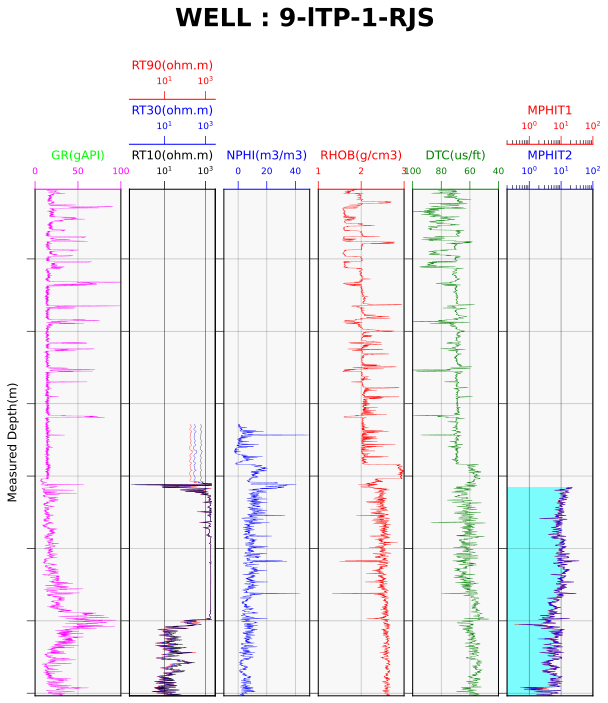

In [29]:
fig, axes = plt.subplots(nrows=1, ncols=8, figsize=(10,11))
fig.suptitle("WELL : 9-lTP-1-RJS", fontsize=25, fontweight='bold')
fig.subplots_adjust(top=0.75, wspace=0.5)

track_names = ['GR(gAPI)','RT90(ohm.m)','RT30(ohm.m)','RT10(ohm.m)','NPHI(m3/m3)','RHOB(g/cm3)','DTC(us/ft)','MPHIT1','MPHIT2']

#Set up the subplots grid
ax1 = plt.subplot2grid((1,6),(0,0),rowspan=1,colspan=1)         
ax2 = plt.subplot2grid((1,6),(0,1),rowspan=1,colspan=1)         
ax3 = ax2.twiny()
ax4 = ax2.twiny()
ax5 = plt.subplot2grid((1,6),(0,2),rowspan=1,colspan=1)
ax6 = plt.subplot2grid((1,6),(0,3),rowspan=1,colspan=1)
ax7 = plt.subplot2grid((1,6),(0,4),rowspan=1,colspan=1)

ax8 = plt.subplot2grid((1,6),(0,5),rowspan=1,colspan=1)
ax9 = ax8.twiny()


####################################################################


# First Track: GR, HCAL
ax1.plot("GR","DEPTH", data = df0_GR, color = "magenta", lw = 0.3)            # To call the data from the df dataframe 
ax1.set_xlim(0,100)                                                      
ax1.spines['top'].set_position(('outward',0)) 
ax1.set_xlabel('GR(gAPI)',color='lime')  
ax1.set_ylabel('Measured Depth(m)',color='black') 
ax1.tick_params(axis='x', colors='magenta')
ax1.spines["top"].set_edgecolor("magenta")


# Second Track: RT90, RT30, RT10
ax2.plot("RT90","DEPTH", data= df0_RT90, color="red", lw = 0.3)
ax2.set_xlim(0.2,3000)                                                   # [0.2-2000] is the typical rang
ax2.semilogx()                                                           # x in a log scale
ax2.spines['top'].set_position(('outward',90))
ax2.set_xlabel('RT90(ohm.m)', color='red') 
ax2.tick_params(axis='x', colors='red')
ax2.spines["top"].set_edgecolor("red")

ax3.plot("RT30","DEPTH", data= df0_RT30, color="blue", lw = 0.3)
ax3.set_xlim(0.2,3000)                                                   # [0.2-2000] is the typical rang
ax3.semilogx()                                                           # x in a log scale
ax3.spines['top'].set_position(('outward',45))
ax3.set_xlabel('RT30(ohm.m)', color='blue') 
ax3.tick_params(axis='x', colors='blue')
ax3.spines["top"].set_edgecolor("blue")

ax4.plot("RT10","DEPTH", data= df0_RT10, color="black", lw = 0.3)
ax4.set_xlim(0.2,3000)                                                    
ax4.semilogx()                                                            
ax4.spines['top'].set_position(('outward',0))
ax4.set_xlabel('RT10(ohm.m)', color='black') 
ax4.tick_params(axis='x', colors='black')
ax4.spines["top"].set_edgecolor("black")


# Third Track: RHOZ, NPHI, PEFZ

ax5.plot("NPHI","DEPTH", data= df0_NPHI, color="blue", lw = 0.3)
ax5.set_xlim(-10,50)
ax5.spines['top'].set_position(('outward',0))
ax5.set_xlabel('NPHI(m3/m3)', color='blue') 
ax5.tick_params(axis='x', colors='blue')
ax5.spines["top"].set_edgecolor("blue")


ax6.plot("RHOB","DEPTH", data= df0_RHOB, color="red", lw = 0.3)
ax6.set_xlim(1,3)                                                         
ax6.spines['top'].set_position(('outward',0))
ax6.set_xlabel('RHOB(g/cm3)', color='red') 
ax6.tick_params(axis='x', colors='red')
ax6.spines["top"].set_edgecolor("red")



# Fourth Track: DTCO
ax7.plot("DTC","DEPTH", data= df0_DTC, color="green", lw = 0.3)
ax7.set_xlim(100,40)                                                      
ax7.spines['top'].set_position(('outward',0))
ax7.set_xlabel('DTC(us/ft)', color='green') 
ax7.tick_params(axis='x', colors='green')
ax7.spines["top"].set_edgecolor("green")


# Fourth Track: NMR
ax8.plot("MPHIT1","DEPTH", data= df0_NMR, color="red", lw = 0.3)
ax8.set_xlim(0.2,100)                                                   # [0.2-2000] is the typical rang
ax8.semilogx()                                                           # x in a log scale
ax8.spines['top'].set_position(('outward',45))
ax8.set_xlabel('RT90(ohm.m)', color='red') 
ax8.tick_params(axis='x', colors='red')
ax8.spines["top"].set_edgecolor("red")

ax9.plot("MPHIT2","DEPTH", data= df0_NMR, color="blue", lw = 0.3)
ax9.set_xlim(0.2,100)                                                   # [0.2-2000] is the typical rang
ax9.semilogx()                                                           # x in a log scale
ax9.spines['top'].set_position(('outward',0))
ax9.set_xlabel('RT30(ohm.m)', color='blue') 
ax9.tick_params(axis='x', colors='blue')
ax9.spines["top"].set_edgecolor("blue")


# Add shading in Fifth Track with fill_betweenx(y, left handside value, x)
ax8.fill_betweenx("DEPTH","MPHIT1",0,          data=df0_NMR, facecolor='aqua',    alpha=0.5, interpolate=True)
ax8.fill_betweenx("DEPTH","MPHIT1","MPHIT2", data=df0_NMR, facecolor='olive',   alpha=0.5, interpolate=True)



###############################################################################################################################################################################

for i, ax in enumerate(fig.axes):
 
    ax.set_ylim(5807.099999,4407.500085)  # Set the depth range
                                          # Depth interval for the prediction
    
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")
    ax.set_xlabel(track_names[i])
    
    if i == 13:                                            
        ax.spines["top"].set_position(("axes", 2))
    else:
        ax.grid(color='black', lw=0.7)                  # To display the grid 
 

# Add a black border to each subplot 
for ax in [ax1, ax2, ax3, ax5, ax6, ax7, ax8]:
    ax.spines['bottom'].set_color('black')
    ax.spines['left'].set_color('black')
    ax.spines['right'].set_color('black') 

# Hide tick labels on the y-axis
for ax in [ax1, ax2, ax3, ax5, ax6, ax7, ax8]:
    plt.setp(ax.get_yticklabels(), visible=False)

    
# Reduce the space between each subplot
fig.subplots_adjust(wspace = 0.1)


Concatenate, horizontally, the new dataframes 

In [ ]:
df0_ML = pd.concat([df0['DEPTH'],df0['GR'],df0['RHGX_HILT'],df0['NPHI'],df1['AT10'],df1['AT20'],df1['AT30'],df1['AT60'],df1['AT90'],df2['PEFZ']], axis = 1, ignore_index = False)
df0_ML

We drop the NaN values. The new depth interval is [3241.243164-3415.741211] (m)

In [ ]:
df0_ML = df0_ML.dropna()
df0_ML

Convert the DataFrame into a CSV file (CSV file is required for ML Algorithms implementation)